In [2]:

import sqlite3
import glob


In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
def hist_category(df,colunas_categoricas):
    '''
    df: dataframe,
    colunas_categoricas: ['','']
    '''
    for col in colunas_categoricas:

        # Inicializa a figura
        plt.figure(figsize=(10, 8))

        # Para cada categoria da variável:
        for value in df[col].unique():

            # Seleciona, no dataframe, apenas as observações que contem esta categoria
            df_filtrado = df.loc[df[col] == value]
            # Plota histograma das observações selecionadas
            plt.hist(df_filtrado[col], alpha=0.6)

        # Adiciona títulos
        plt.title(f'Histograma de {col}', fontsize=15, fontweight='bold')
        plt.xlabel(f'Valores ')
        plt.ylabel('Frequência')

        # Adiciona legenda
       # plt.legend(list(df[col].unique()))

        # Mostra a figura
        plt.show()

In [3]:
def chunk_db(files, db_name):
    '''
    files = glob.glob('caminho da pasta com arquivos/*.csv')
    dc_name = o nome da database
    OBS: o nome das colunas no database vai ficar conforme os nomes dos arquivos.csv.
    Muito provavel ter que adaptar o table_name na função.
    '''
    db_name = db_name
    con = sqlite3.connect(f'{db_name}.db')
    # Para cada um dos arquivos
    for file in files:

        # Define o nome da tabela como sendo o nome do arquivo sem o .csv
        table_name = file.split('\\')[1].replace('.CSV','')

        # Carrega o arquivo indicado em chunks (lotes) de forma
        # a permitir operação com dataframes grandes demais
        df_chunks = pd.read_csv(file,sep='|',encoding='latin-1', chunksize=100000)

        # Para cada lote ("pedaço") do dataframe
        for df in df_chunks:

            # Escreve o pedaço no banco
            df.to_sql(
                name=table_name, # Define o nome da tabela a receber as informações (ou ser criada)
                index=False, # Não escreve o índice do dataframe na tabela
                if_exists='append', # Se a tabela já existir, adiciona as informações abaixo das existentes
                con=con # Define em qual banco os dados serão inseridos
            )

Pra Usar a função acima:

In [4]:
chunk_db(files, 'db_inep')

C:\Users\Thalita\anaconda3\envs\env\lib\site-packages\IPython\core\interactiveshell.py:3357: DtypeWarning: Columns (17) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [5]:
def p_null(df):
    """
    Mostra as colunas que tem null e que não tem e suas porcentagens.
    """
    for column in df.columns:
        if df[column].isnull().sum()==0:
            print(f'No null in column: {column}')
        else:
            print(f'Null in column: {column}')
    print( )
    print('The columns with the most % nulls are:')
    return(((df.isnull().sum()/df.shape[0])*100).sort_values(ascending = False))


----------------------------------------------------------------------------
<h1>PREPARAÇÃO PRA FAZER A FUNÇÃO DO FOR PRA CONEXAO E CRIAÇÃO DO DB</h1>

In [6]:
files = glob.glob('DADOS/*.csv')
files

['DADOS\\DM_ALUNO.CSV',
 'DADOS\\DM_CURSO.CSV',
 'DADOS\\DM_DOCENTE.CSV',
 'DADOS\\DM_IES.CSV',
 'DADOS\\DM_LOCAL_OFERTA.CSV']

In [7]:
file = files[0]
file

'DADOS\\DM_ALUNO.CSV'

In [37]:
#file = file.split('\\')[1].replace('.CSV','')

'DM_ALUNO'

In [8]:
# transformando arquivo csv para db
## Primeiro conecta
db_name = 'db_inep'
con = sqlite3.connect(f'{db_name}.db')

In [46]:
df_chunk = pd.read_csv(file,sep='|',chunksize = 50000)

In [29]:
#Passando para o sql:
'''for df in df_chunk:
    df.to_sql(
    name = file.split('\\')[1].replace('.CSV',''), --> table_name
    index = False,
    if_exists = 'append',
    con = con
    )'''

"for df in df_chunk:\n    df.to_sql(\n    name = file.split('\\')[1].replace('.CSV',''),\n    index = False,\n    if_exists = 'append',\n    con = con\n    )"

In [ ]:
con.execute('DROP ')

------------------------------------------------------------------------------------------

In [9]:
pd.read_sql_query('SELECT * FROM sqlite_master',con)

,type,name,tbl_name,rootpage,sql
0,table,DM_ALUNO,DM_ALUNO,2,"CREATE TABLE ""DM_ALUNO"" (\n""CO_IES"" INTEGER,\n..."
1,table,DM_CURSO,DM_CURSO,1376835,"CREATE TABLE ""DM_CURSO"" (\n""CO_IES"" INTEGER,\n..."
2,table,DM_DOCENTE,DM_DOCENTE,1380554,"CREATE TABLE ""DM_DOCENTE"" (\n""CO_IES"" INTEGER,..."
3,table,DM_IES,DM_IES,1404217,"CREATE TABLE ""DM_IES"" (\n""CO_IES"" INTEGER,\n ..."
4,table,DM_LOCAL_OFERTA,DM_LOCAL_OFERTA,1404385,"CREATE TABLE ""DM_LOCAL_OFERTA"" (\n""CO_LOCAL_OF..."



<a id ='Alunos'><h1> ALUNOS </h1></a>

In [10]:
#Trazendo a Table Aluno pra dar uma verificada
aluno = pd.read_sql_query('SELECT * FROM DM_ALUNO LIMIT 2',con)
aluno


,CO_IES,NO_IES,CO_CATEGORIA_ADMINISTRATIVA,DS_CATEGORIA_ADMINISTRATIVA,CO_ORGANIZACAO_ACADEMICA,DS_ORGANIZACAO_ACADEMICA,CO_CURSO,NO_CURSO,CO_CURSO_POLO,CO_TURNO_ALUNO,...,IN_MOBILIDADE_ACADEMICA,CO_MOBILIDADE_ACADEMICA,CO_MOBILIDADE_ACADEMICA_INTERN,CO_IES_DESTINO,CO_PAIS_DESTINO,IN_MATRICULA,IN_CONCLUINTE,IN_INGRESSO_TOTAL,IN_INGRESSO_VAGA_NOVA,ANO_INGRESSO
0,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,1,DIREITO,None,3.0,...,0.0,None,None,None,None,1,0,1,1,2016
1,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,1,DIREITO,None,3.0,...,0.0,None,None,None,None,1,0,0,0,2012


In [8]:
#Selecionando algumas colunas

query = '''
SELECT CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,DS_ORGANIZACAO_ACADEMICA,NO_CURSO,DS_TURNO_ALUNO,DS_MODALIDADE_ENSINO,NO_OCDE_AREA_GERAL,DS_SEXO_ALUNO,DS_ALUNO_SITUACAO,ANO_INGRESSO
FROM DM_ALUNO
'''
aluno_sel = pd.read_sql_query(query,con)
aluno_sel

,CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,DS_ORGANIZACAO_ACADEMICA,NO_CURSO,DS_TURNO_ALUNO,DS_MODALIDADE_ENSINO,NO_OCDE_AREA_GERAL,DS_SEXO_ALUNO,DS_ALUNO_SITUACAO,ANO_INGRESSO
0,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,Universidade,DIREITO,Noturno,Presencial,"Ciências sociais, negócios e direito",Masculino,Cursando,2016
1,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,Universidade,DIREITO,Noturno,Presencial,"Ciências sociais, negócios e direito",Masculino,Cursando,2012
2,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,Universidade,DIREITO,Noturno,Presencial,"Ciências sociais, negócios e direito",Feminino,Matrícula trancada,2015
3,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,Universidade,DIREITO,Noturno,Presencial,"Ciências sociais, negócios e direito",Masculino,Matrícula trancada,2013
4,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,Universidade,DIREITO,Matutino,Presencial,"Ciências sociais, negócios e direito",Masculino,Desvinculado do curso,2011
...,...,...,...,...,...,...,...,...,...,...,...
11449217,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,Faculdade,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS,Matutino,Presencial,"Ciências, matemática e computação",Masculino,Matrícula trancada,2015
11449218,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,Faculdade,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS,Noturno,Presencial,"Ciências, matemática e computação",Feminino,Matrícula trancada,2015
11449219,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,Faculdade,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS,Noturno,Presencial,"Ciências, matemática e computação",Masculino,Matrícula trancada,2016
11449220,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,Faculdade,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS,Noturno,Presencial,"Ciências, matemática e computação",Masculino,Matrícula trancada,2015


In [11]:
p_null(aluno_sel)

No null in column: CO_IES
No null in column: NO_IES
No null in column: DS_CATEGORIA_ADMINISTRATIVA
No null in column: DS_ORGANIZACAO_ACADEMICA
No null in column: NO_CURSO
No null in column: DS_TURNO_ALUNO
No null in column: DS_MODALIDADE_ENSINO
Null in column: NO_OCDE_AREA_GERAL
No null in column: DS_SEXO_ALUNO
No null in column: DS_ALUNO_SITUACAO
No null in column: ANO_INGRESSO

The columns with the most % nulls are:


NO_OCDE_AREA_GERAL             0.456538
CO_IES                         0.000000
NO_IES                         0.000000
DS_CATEGORIA_ADMINISTRATIVA    0.000000
DS_ORGANIZACAO_ACADEMICA       0.000000
NO_CURSO                       0.000000
DS_TURNO_ALUNO                 0.000000
DS_MODALIDADE_ENSINO           0.000000
DS_SEXO_ALUNO                  0.000000
DS_ALUNO_SITUACAO              0.000000
ANO_INGRESSO                   0.000000
dtype: float64

In [12]:
aluno_sel['NO_OCDE_AREA_GERAL'].unique()

array(['Ciências sociais, negócios e direito',
       'Engenharia, produção e construção', 'Educação',
       'Saúde e bem estar social', 'Agricultura e veterinária',
       'Ciências, matemática e computação', 'Humanidades e artes',
       'Serviços', None], dtype=object)

In [14]:
#Dando uma olhada no df onde na coluna é nula
aluno_NO_OCDE_null = aluno_sel.loc[aluno_sel['NO_OCDE_AREA_GERAL'].isnull(),:]
aluno_NO_OCDE_null.shape[0]

52270

In [19]:
#Colunas categóricas (qualitativas)
#aluno_sel['CO_IES'] = aluno_sel['CO_IES'].astype('category') #qualitativa ordinais

for col in aluno_sel.columns:
    aluno_sel[col] = aluno_sel[col].astype('category')

In [20]:
aluno_sel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11449222 entries, 0 to 11449221
Data columns (total 11 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   CO_IES                       category
 1   NO_IES                       category
 2   DS_CATEGORIA_ADMINISTRATIVA  category
 3   DS_ORGANIZACAO_ACADEMICA     category
 4   NO_CURSO                     category
 5   DS_TURNO_ALUNO               category
 6   DS_MODALIDADE_ENSINO         category
 7   NO_OCDE_AREA_GERAL           category
 8   DS_SEXO_ALUNO                category
 9   DS_ALUNO_SITUACAO            category
 10  ANO_INGRESSO                 category
dtypes: category(11)
memory usage: 153.1 MB


In [16]:
query = '''
SELECT NO_IES,DS_ALUNO_SITUACAO,CO_ALUNO_CURSO 
FROM DM_ALUNO
'''
aluno_se2 = pd.read_sql_query(query,con)
aluno_se2

,NO_IES,DS_ALUNO_SITUACAO,CO_ALUNO_CURSO
0,UNIVERSIDADE FEDERAL DE MATO GROSSO,Cursando,25001314
1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Cursando,25037243
2,UNIVERSIDADE FEDERAL DE MATO GROSSO,Matrícula trancada,25030916
3,UNIVERSIDADE FEDERAL DE MATO GROSSO,Matrícula trancada,25016919
4,UNIVERSIDADE FEDERAL DE MATO GROSSO,Desvinculado do curso,25001942
...,...,...,...
11449217,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Matrícula trancada,26245685
11449218,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Matrícula trancada,26245688
11449219,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Matrícula trancada,26245691
11449220,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Matrícula trancada,26245693


In [21]:
for col in aluno_se2.columns:
    aluno_se2[col]=aluno_se2[col].astype('category')

<a id='ex_01_parte2'>Exercicio 01- parte02</a>

In [346]:
aluno_se2.loc[aluno_se2['NO_IES']=='FACULDADE BARDDAL',:]

,NO_IES,DS_ALUNO_SITUACAO,CO_ALUNO_CURSO
7895330,FACULDADE BARDDAL,Desvinculado do curso,17505590
7895331,FACULDADE BARDDAL,Desvinculado do curso,17514368
7895332,FACULDADE BARDDAL,Desvinculado do curso,17504588
7895333,FACULDADE BARDDAL,Desvinculado do curso,17504595
7895334,FACULDADE BARDDAL,Desvinculado do curso,17504598
7895335,FACULDADE BARDDAL,Desvinculado do curso,17508746
7895336,FACULDADE BARDDAL,Desvinculado do curso,17508753
7895337,FACULDADE BARDDAL,Desvinculado do curso,17508759
7895338,FACULDADE BARDDAL,Desvinculado do curso,17504606
7895339,FACULDADE BARDDAL,Cursando,17514540


In [349]:
aluno_se2.loc[aluno_se2['NO_IES']=='FACULDADES INTEGRADAS DE SÃO PAULO',:]

,NO_IES,DS_ALUNO_SITUACAO,CO_ALUNO_CURSO
7221784,FACULDADES INTEGRADAS DE SÃO PAULO,Desvinculado do curso,17225742
7221785,FACULDADES INTEGRADAS DE SÃO PAULO,Formado,25736258
7221786,FACULDADES INTEGRADAS DE SÃO PAULO,Desvinculado do curso,17229397
7221787,FACULDADES INTEGRADAS DE SÃO PAULO,Formado,25736287
7221788,FACULDADES INTEGRADAS DE SÃO PAULO,Desvinculado do curso,17229336
7221789,FACULDADES INTEGRADAS DE SÃO PAULO,Desvinculado do curso,25736275
7221790,FACULDADES INTEGRADAS DE SÃO PAULO,Formado,25736286
7221791,FACULDADES INTEGRADAS DE SÃO PAULO,Formado,17229323
7221792,FACULDADES INTEGRADAS DE SÃO PAULO,Formado,25736272
7221793,FACULDADES INTEGRADAS DE SÃO PAULO,Desvinculado do curso,17229347


<a id='Exercicio_alunos_exatas'>Exercicio alunos exatas</a>

In [351]:
query = '''
SELECT NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,DS_ALUNO_SITUACAO
FROM DM_ALUNO;
'''
alunos_sel3 = pd.read_sql_query(query,con)

In [352]:
alunos_sel3

,NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,DS_ALUNO_SITUACAO
0,"Ciências sociais, negócios e direito",0,Cursando
1,"Ciências sociais, negócios e direito",0,Cursando
2,"Ciências sociais, negócios e direito",1,Matrícula trancada
3,"Ciências sociais, negócios e direito",0,Matrícula trancada
4,"Ciências sociais, negócios e direito",0,Desvinculado do curso
...,...,...,...
11449217,"Ciências, matemática e computação",0,Matrícula trancada
11449218,"Ciências, matemática e computação",1,Matrícula trancada
11449219,"Ciências, matemática e computação",0,Matrícula trancada
11449220,"Ciências, matemática e computação",0,Matrícula trancada


In [362]:
#VAmos selecionar somente os cursos considerados exatas = 'Engenharia, produção e construção','Ciências, matemática e computação'
exatas = ['Engenharia, produção e construção','Ciências, matemática e computação']
alunos_exatas = alunos_sel3[(alunos_sel3['NO_OCDE_AREA_GERAL']=='Engenharia, produção e construção')|(alunos_sel3['NO_OCDE_AREA_GERAL']== 'Ciências, matemática e computação')]

In [367]:
alunos_exatas_cursando = alunos_exatas.loc[alunos_exatas['DS_ALUNO_SITUACAO']=='Cursando',:]
alunos_exatas_cursando

,NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,DS_ALUNO_SITUACAO
1360,"Engenharia, produção e construção",0,Cursando
1362,"Engenharia, produção e construção",0,Cursando
1367,"Engenharia, produção e construção",0,Cursando
1371,"Engenharia, produção e construção",0,Cursando
1380,"Engenharia, produção e construção",0,Cursando
...,...,...,...
11449203,"Ciências, matemática e computação",0,Cursando
11449204,"Ciências, matemática e computação",0,Cursando
11449205,"Ciências, matemática e computação",0,Cursando
11449206,"Ciências, matemática e computação",0,Cursando


In [16]:
query ='''
SELECT  NO_IES,CO_ALUNO, DS_ALUNO_SITUACAO,CO_ALUNO_CURSO, CO_ALUNO_CURSO_ORIGEM,NO_CURSO
FROM DM_ALUNO
'''
EX_04_ALUNO = pd.read_sql_query(query,con)
EX_04_ALUNO 

,NO_IES,CO_ALUNO,DS_ALUNO_SITUACAO,CO_ALUNO_CURSO,CO_ALUNO_CURSO_ORIGEM,NO_CURSO
0,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001339152,Cursando,25001314,NaN,DIREITO
1,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001346379,Cursando,25037243,NaN,DIREITO
2,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001398311,Matrícula trancada,25030916,NaN,DIREITO
3,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001521409,Matrícula trancada,25016919,NaN,DIREITO
4,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001521722,Desvinculado do curso,25001942,NaN,DIREITO
...,...,...,...,...,...,...
11449217,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825923,Matrícula trancada,26245685,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS
11449218,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825924,Matrícula trancada,26245688,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS
11449219,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825925,Matrícula trancada,26245691,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS
11449220,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825926,Matrícula trancada,26245693,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS



<a id='Taxa_abandono'> Exercício 04 - Alunos taxa abandono </a>


In [19]:
EX_04_ALUNO.DS_ALUNO_SITUACAO.unique() 

array(['Cursando', 'Matrícula trancada', 'Desvinculado do curso',
       'Formado', 'Transferido para outro curso da mesma IES', 'Falecido'],
      dtype=object)

In [20]:
# Estou considerando abandono do curso os alunos com Matricula trancada, desvinculado do Curso ou transferido 
# Do Total de 11.449.222 rows de alunos  , 3.395.785 abandonaram o curso que estavam fazendo  =  mais de 29%
alunos_taxa_abandono = EX_04_ALUNO.loc[(EX_04_ALUNO['DS_ALUNO_SITUACAO']!='Cursando')&
                                      (EX_04_ALUNO['DS_ALUNO_SITUACAO']!='Formado')&
                                      (EX_04_ALUNO['DS_ALUNO_SITUACAO']!='Falecido'),:]
alunos_taxa_abandono

,NO_IES,CO_ALUNO,DS_ALUNO_SITUACAO,CO_ALUNO_CURSO,CO_ALUNO_CURSO_ORIGEM,NO_CURSO
2,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001398311,Matrícula trancada,25030916,NaN,DIREITO
3,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001521409,Matrícula trancada,25016919,NaN,DIREITO
4,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001521722,Desvinculado do curso,25001942,NaN,DIREITO
8,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001561465,Matrícula trancada,25004008,NaN,DIREITO
13,UNIVERSIDADE FEDERAL DE MATO GROSSO,400001634283,Desvinculado do curso,25034884,NaN,DIREITO
...,...,...,...,...,...,...
11449217,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825923,Matrícula trancada,26245685,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS
11449218,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825924,Matrícula trancada,26245688,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS
11449219,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825925,Matrícula trancada,26245691,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS
11449220,Faculdade de Tecnologia - Fatec de Ribeirão Preto,400023825926,Matrícula trancada,26245693,NaN,ANÁLISE E DESENVOLVIMENTO DE SISTEMAS


In [21]:
#Conferindo
alunos_taxa_abandono.DS_ALUNO_SITUACAO.unique()

array(['Matrícula trancada', 'Desvinculado do curso',
       'Transferido para outro curso da mesma IES'], dtype=object)

In [22]:
alunos_taxa_abandono.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3395785 entries, 2 to 11449221
Data columns (total 6 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   NO_IES                 object 
 1   CO_ALUNO               int64  
 2   DS_ALUNO_SITUACAO      object 
 3   CO_ALUNO_CURSO         int64  
 4   CO_ALUNO_CURSO_ORIGEM  float64
 5   NO_CURSO               object 
dtypes: float64(1), int64(2), object(3)
memory usage: 181.4+ MB


In [23]:
for col in alunos_taxa_abandono.columns:
    alunos_taxa_abandono[col]=alunos_taxa_abandono[col].astype('category')

<ipython-input-23-46ae9ccb46e2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alunos_taxa_abandono[col]=alunos_taxa_abandono[col].astype('category')


In [913]:
alunos_taxa_abandono.shape[0]

3395785

In [629]:
# A coluna que tem mais de 99% de nulos é a que gera códido (Inep) vinculando o aluno em seu curso de origem ou melhor, de onde foi transferido
# Pra simplificar são os alunos transferidos - Como a maioria não trasferiu então vai ter bastante espaço em branco
# Os valores notnull dessa coluna igualei aos alunos trasferidos.
p_null(alunos_taxa_abandono)

No null in column: CO_ALUNO
No null in column: DS_ALUNO_SITUACAO
No null in column: CO_ALUNO_CURSO
Null in column: CO_ALUNO_CURSO_ORIGEM
No null in column: NO_CURSO

The columns with the most % nulls are:


CO_ALUNO_CURSO_ORIGEM    99.511777
CO_ALUNO                  0.000000
DS_ALUNO_SITUACAO         0.000000
CO_ALUNO_CURSO            0.000000
NO_CURSO                  0.000000
dtype: float64

----------------------------------------------------------------------------------

In [630]:
# Dataframe de somente os alunos transferidos
alunos_taxa_abandono[alunos_taxa_abandono['CO_ALUNO_CURSO_ORIGEM'].notnull()]

,CO_ALUNO,DS_ALUNO_SITUACAO,CO_ALUNO_CURSO,CO_ALUNO_CURSO_ORIGEM,NO_CURSO
11765,400022535286,Matrícula trancada,25072015,25072014.0,MEDICINA VETERINÁRIA
31273,400008516445,Desvinculado do curso,25018397,25018395.0,QUÍMICA
42546,400010781440,Matrícula trancada,13072753,13072749.0,EDUCAÇÃO FÍSICA
47541,400005798447,Matrícula trancada,12376030,12376028.0,ARTES PLÁSTICAS
47599,400018722834,Desvinculado do curso,12778912,12778890.0,ARTES PLÁSTICAS
49616,400020150002,Desvinculado do curso,20730416,22852595.0,MATEMÁTICA
49851,400013256798,Desvinculado do curso,13070017,13070013.0,LETRAS - PORTUGUÊS
49919,400015479357,Desvinculado do curso,13033741,13033739.0,LETRAS - PORTUGUÊS
53478,400014129521,Desvinculado do curso,12838025,12838023.0,COMPUTAÇÃO
54278,400010781753,Desvinculado do curso,13073311,13073307.0,MATEMÁTICA


In [107]:
alunos_trasferidos = alunos_taxa_abandono[alunos_taxa_abandono['CO_ALUNO_CURSO_ORIGEM'].notnull()][['DS_ALUNO_SITUACAO','NO_CURSO']]

In [643]:
# Há alunos que mesmo depois da trasferência trancou matrícula
alunos_trasferidos.DS_ALUNO_SITUACAO.unique('DS_ALUNO_SITUACAO')

['Matrícula trancada', 'Desvinculado do curso']
Categories (2, object): ['Matrícula trancada', 'Desvinculado do curso']

In [646]:
alunos_trasferidos.groupby('DS_ALUNO_SITUACAO').count()

,NO_CURSO
DS_ALUNO_SITUACAO,
Desvinculado do curso,7539
Matrícula trancada,9040
Transferido para outro curso da mesma IES,0


<a id ='Cursos'><h1> Cursos </h1></a>

In [84]:
curso = pd.read_sql_query('SELECT * FROM DM_CURSO',con)
curso

,CO_IES,NO_IES,CO_CATEGORIA_ADMINISTRATIVA,DS_CATEGORIA_ADMINISTRATIVA,CO_ORGANIZACAO_ACADEMICA,DS_ORGANIZACAO_ACADEMICA,CO_LOCAL_OFERTA_CURSO,CO_MUNICIPIO_CURSO,NO_MUNICIPIO_CURSO,CO_UF_CURSO,SGL_UF_CURSO,NO_REGIAO_CURSO,IN_CAPITAL_CURSO,CO_CURSO,NO_CURSO,CO_SITUACAO_CURSO,DS_SITUACAO_CURSO,CO_OCDE,NO_OCDE,CO_OCDE_AREA_GERAL,NO_OCDE_AREA_GERAL,CO_OCDE_AREA_ESPECIFICA,NO_OCDE_AREA_ESPECIFICA,CO_OCDE_AREA_DETALHADA,NO_OCDE_AREA_DETALHADA,CO_GRAU_ACADEMICO,DS_GRAU_ACADEMICO,CO_MODALIDADE_ENSINO,DS_MODALIDADE_ENSINO,CO_NIVEL_ACADEMICO,DS_NIVEL_ACADEMICO,IN_GRATUITO,TP_ATRIBUTO_INGRESSO,NU_CARGA_HORARIA,DT_INICIO_FUNCIONAMENTO,DT_AUTORIZACAO_CURSO,IN_AJUDA_DEFICIENTE,IN_MATERIAL_DIGITAL,IN_MATERIAL_AMPLIADO,IN_MATERIAL_TATIL,IN_MATERIAL_IMPRESSO,IN_MATERIAL_AUDIO,IN_MATERIAL_BRAILLE,IN_MATERIAL_LIBRAS,IN_DISCIPLINA_LIBRAS,IN_TRADUTOR_LIBRAS,IN_GUIA_INTERPRETE,IN_RECURSOS_COMUNICACAO,IN_RECURSOS_INFORMATICA,IN_INTEGRAL_CURSO,IN_MATUTINO_CURSO,IN_VESPERTINO_CURSO,IN_NOTURNO_CURSO,NU_INTEGRALIZACAO_INTEGRAL,NU_INTEGRALIZACAO_MATUTINO,NU_INTEGRALIZACAO_VESPERTINO,NU_INTEGRALIZACAO_NOTURNO,NU_INTEGRALIZACAO_EAD,IN_OFERECE_DISC_SEMI_PRES,NU_PERC_CAR_HOR_SEMI_PRES,IN_POSSUI_LABORATORIO,QT_INSC_VAGAS_NOVAS_INT,QT_INSC_VAGAS_NOVAS_MAT,QT_INSC_VAGAS_NOVAS_VESP,QT_INSC_VAGAS_NOVAS_NOT,QT_INSC_VAGAS_NOVAS_EAD,QT_INSC_VAGAS_REMAN_INT,QT_INSC_VAGAS_REMAN_MAT,QT_INSC_VAGAS_REMAN_VESP,QT_INSC_VAGAS_REMAN_NOT,QT_INSC_VAGAS_REMAN_EAD,QT_INSC_VAGAS_PROG_ESP_INT,QT_INSC_VAGAS_PROG_ESP_MAT,QT_INSC_VAGAS_PROG_ESP_VESP,QT_INSC_VAGAS_PROG_ESP_NOT,QT_INSC_VAGAS_PROG_ESP_EAD,QT_VAGAS_NOVAS_INTEGRAL,QT_VAGAS_NOVAS_MATUTINO,QT_VAGAS_NOVAS_VESPERTINO,QT_VAGAS_NOVAS_NOTURNO,QT_VAGAS_NOVAS_EAD,QT_VAGAS_REMANESC_INTEGRAL,QT_VAGAS_REMANESC_MATUTINO,QT_VAGAS_REMANESC_VESPERTINO,QT_VAGAS_REMANESC_NOTURNO,QT_VAGAS_REMANESC_EAD,QT_VAGAS_PROG_ESP_INTEGRAL,QT_VAGAS_PROG_ESP_MATUTINO,QT_VAGAS_PROG_ESP_VESPERTINO,QT_VAGAS_PROG_ESP_NOTURNO,QT_VAGAS_PROG_ESP_EAD,QT_MATRICULA_CURSO,QT_CONCLUINTE_CURSO,QT_INGRESSO_CURSO,QT_INGRESSO_VAGAS_NOVAS,QT_VAGAS_TOTAIS
0,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,105340.0,5103403.0,Cuiabá,51.0,MT,Centro-Oeste,1.0,1,DIREITO,1,Em atividade,380D01,Direito,3.0,"Ciências sociais, negócios e direito",38.0,Direito,380.0,Direito,1.0,Bacharelado,1,Presencial,1,Graduação,1.0,0,3700,05/09/1952,None,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,NaN,5.0,NaN,5.0,NaN,0.0,NaN,1,NaN,1556.0,NaN,2332.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,45.0,NaN,45.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,NaN,432.0,66.0,91.0,89.0,90
1,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,105340.0,5103403.0,Cuiabá,51.0,MT,Centro-Oeste,1.0,2,CIÊNCIAS ECONÔMICAS,1,Em atividade,314E02,Economia,3.0,"Ciências sociais, negócios e direito",31.0,Ciências sociais e comportamentais,314.0,Economia,1.0,Bacharelado,1,Presencial,1,Graduação,1.0,0,3000,11/10/1968,None,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,NaN,4.0,NaN,4.0,NaN,0.0,NaN,1,NaN,458.0,NaN,553.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,53.0,NaN,53.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,NaN,391.0,63.0,103.0,103.0,106
2,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,105340.0,5103403.0,Cuiabá,51.0,MT,Centro-Oeste,1.0,3,ENGENHARIA CIVIL,1,Em atividade,582E03,Engenharia civil,5.0,"Engenharia, produção e construção",58.0,Arquitetura e construção,582.0,Engenharia civil e de construção,1.0,Bacharelado,1,Presencial,1,Graduação,1.0,0,3960,11/10/1968,None,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,NaN,NaN,NaN,NaN,0.0,NaN,1,1120.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,55.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,266.0,36.0,56.0,55.0,55
3,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,105340.0,5103403.0,Cuiabá,51.0,MT,Centro-Oeste,1.0,6,PEDAGOGIA,1,Em atividade,142P01,Pedagogia,1.0,Educação,14.0,Formação de professor 

In [ ]:
'CO_IES','NO_IES','DS_CATEGORIA_ADMINISTRATIVA','SGL_UF_CURSO','NO_REGIAO_CURSO'

In [85]:
query ='''
select distinct DS_SITUACAO_CURSO FROM DM_CURSO;
'''
pd.read_sql_query(query,con)

,DS_SITUACAO_CURSO
0,Em atividade
1,Em extinção
2,Extinto


In [86]:
colunas_qualitativas = ['CO_IES','NO_IES','DS_CATEGORIA_ADMINISTRATIVA','NO_MUNICIPIO_CURSO','SGL_UF_CURSO','NO_REGIAO_CURSO','DT_INICIO_FUNCIONAMENTO']
for col in curso[colunas_qualitativas]:
    curso[col]=curso[col].astype('category')

In [87]:
curso['QT_VAGAS_NOVAS_EAD'].astype('float64')

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
34690   NaN
34691   NaN
34692   NaN
34693   NaN
34694   NaN
Name: QT_VAGAS_NOVAS_EAD, Length: 34695, dtype: float64

In [89]:

query = '''
SELECT NO_IES,DS_SITUACAO_CURSO,NO_REGIAO_CURSO,NO_OCDE,DT_INICIO_FUNCIONAMENTO

FROM DM_CURSO;
'''
curso_sel = pd.read_sql_query(query,con)
curso_sel

,NO_IES,DS_SITUACAO_CURSO,NO_REGIAO_CURSO,NO_OCDE,DT_INICIO_FUNCIONAMENTO
0,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Direito,05/09/1952
1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Economia,11/10/1968
2,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Engenharia civil,11/10/1968
3,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Pedagogia,15/09/1970
4,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Serviço social,09/03/1970
...,...,...,...,...,...
34690,Faculdade de Tecnologia de Itapira,Em atividade,Sudeste,Produção industrial,05/02/2015
34691,Faculdade de Tecnologia de Santana de Parnaíba,Em atividade,Sudeste,Empreendedorismo,03/02/2015
34692,Academia Militar das Agulhas Negras,Em atividade,Sudeste,Ciência militar,23/04/1952
34693,Escola de Educação Física do Exército,Em atividade,Sudeste,Educação física,02/02/2015


In [90]:
curso_sel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34695 entries, 0 to 34694
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   NO_IES                   34695 non-null  object
 1   DS_SITUACAO_CURSO        34695 non-null  object
 2   NO_REGIAO_CURSO          33031 non-null  object
 3   NO_OCDE                  34440 non-null  object
 4   DT_INICIO_FUNCIONAMENTO  33923 non-null  object
dtypes: object(5)
memory usage: 1.3+ MB


<a id='Cursos_novos'>Cursos Novos por ano em atividade</a>

In [91]:
p_null(curso_sel)

No null in column: NO_IES
No null in column: DS_SITUACAO_CURSO
Null in column: NO_REGIAO_CURSO
Null in column: NO_OCDE
Null in column: DT_INICIO_FUNCIONAMENTO

The columns with the most % nulls are:


NO_REGIAO_CURSO            4.796080
DT_INICIO_FUNCIONAMENTO    2.225104
NO_OCDE                    0.734976
NO_IES                     0.000000
DS_SITUACAO_CURSO          0.000000
dtype: float64

<a id='Ex_03'><h1> Resposta exercicio 3 </h1></a>

In [92]:
(curso_sel[curso_sel['DT_INICIO_FUNCIONAMENTO'].isnull()]).shape[0]

772

In [115]:
#  DS_SITUACAO_CURSO    NO_OCDE     DT_INICIO_FUNCIONAMENTO
curso_data_inicio = (curso_sel[curso_sel['DT_INICIO_FUNCIONAMENTO'].notnull()])
curso_data_inicio

,NO_IES,DS_SITUACAO_CURSO,NO_REGIAO_CURSO,NO_OCDE,DT_INICIO_FUNCIONAMENTO
0,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Direito,05/09/1952
1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Economia,11/10/1968
2,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Engenharia civil,11/10/1968
3,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Pedagogia,15/09/1970
4,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Serviço social,09/03/1970
...,...,...,...,...,...
34689,Faculdade de Tecnologia de Itapira,Em atividade,Sudeste,Gestão da informação,28/07/2014
34690,Faculdade de Tecnologia de Itapira,Em atividade,Sudeste,Produção industrial,05/02/2015
34691,Faculdade de Tecnologia de Santana de Parnaíba,Em atividade,Sudeste,Empreendedorismo,03/02/2015
34692,Academia Militar das Agulhas Negras,Em atividade,Sudeste,Ciência militar,23/04/1952


In [116]:
curso_data_inicio.DT_INICIO_FUNCIONAMENTO[1].split('/')[-1]

'1968'

In [118]:
curso_data_inicio['DT_INICIO_FUNCIONAMENTO']=(curso_data_inicio['DT_INICIO_FUNCIONAMENTO'].map(lambda x:x.split('/')[-1] ))
curso_data_inicio

<ipython-input-118-c84f3171252c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  curso_data_inicio['DT_INICIO_FUNCIONAMENTO']=(curso_data_inicio['DT_INICIO_FUNCIONAMENTO'].map(lambda x:x.split('/')[-1] ))


,NO_IES,DS_SITUACAO_CURSO,NO_REGIAO_CURSO,NO_OCDE,DT_INICIO_FUNCIONAMENTO
0,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Direito,1952
1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Economia,1968
2,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Engenharia civil,1968
3,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Pedagogia,1970
4,UNIVERSIDADE FEDERAL DE MATO GROSSO,Em atividade,Centro-Oeste,Serviço social,1970
...,...,...,...,...,...
34689,Faculdade de Tecnologia de Itapira,Em atividade,Sudeste,Gestão da informação,2014
34690,Faculdade de Tecnologia de Itapira,Em atividade,Sudeste,Produção industrial,2015
34691,Faculdade de Tecnologia de Santana de Parnaíba,Em atividade,Sudeste,Empreendedorismo,2015
34692,Academia Militar das Agulhas Negras,Em atividade,Sudeste,Ciência militar,1952


In [131]:
# Cursos novos/ ano que ainda estão em atividade
curso_sel_em_atividade = curso_data_inicio.loc[curso_data_inicio['DT_INICIO_FUNCIONAMENTO']=='Em atividade',:]


In [132]:
curso_sel_em_atividade = curso_data_inicio.loc[curso_data_inicio['DS_SITUACAO_CURSO']=='Em atividade',:]

In [133]:
curso_sel_em_atividade['DT_INICIO_FUNCIONAMENTO']=pd.Series(curso_sel_em_atividade['DT_INICIO_FUNCIONAMENTO'])

<ipython-input-133-80f8de7c7c99>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  curso_sel_em_atividade['DT_INICIO_FUNCIONAMENTO']=pd.Series(curso_sel_em_atividade['DT_INICIO_FUNCIONAMENTO'])


In [134]:
# Agrupando pelo nome do Curso - ex: Direito, Pedagogia ,Economia...
curso_ematividade_xs = curso_sel_em_atividade.groupby('DT_INICIO_FUNCIONAMENTO').count().sort_index(ascending=False)
curso_ematividade_xs

,NO_IES,DS_SITUACAO_CURSO,NO_REGIAO_CURSO,NO_OCDE
DT_INICIO_FUNCIONAMENTO,,,,
2016,956,956,839,956
2015,1899,1899,1741,1899
2014,1856,1856,1657,1851
2013,1428,1428,1297,1427
2012,1506,1506,1430,1506
...,...,...,...,...
1828,2,2,2,2
1820,1,1,1,1
1816,2,2,2,2


In [135]:
pd.set_option('display.max_row',11000)

In [147]:
# Cursos separados por ano /regia(NO_REGIAO_CURSO)/ No (NO_OCDE)/
curso_data_inicio_pivot = pd.pivot_table(curso_data_inicio,index=['DT_INICIO_FUNCIONAMENTO','NO_REGIAO_CURSO','NO_OCDE'],aggfunc='count')
curso_data_inicio_pivot.sort_index(level=(0,1),ascending=False)

DS_SITUACAO_CURSO  \
DT_INICIO_FUNCIONAMENTO NO_REGIAO_CURSO NO_OCDE                                                                 
2016                    Sul             Uso da internet                                                     1   
                                        Tecnologia em produção de grãos                                     1   
                                        Tecnologia em desenvolvimento de softwares                          1   
                                        Tecnologia em agronegócio                                           2   
                                        Sistemas de informação                                              1   
                                        Redação criativa / expressão escrita                                1   
                                        Química                                                             1   
                                        Publicidade e propaganda                                            1   
                                        Psicologia                                                          7   
                                        Pedagogia                                                           4   
                                        Odontologia                                                         2   
                                        Nutrição                                                            5   
                                        Medicina veterinária                                                3   
                                        Medicina                                                            1   
                                        Marketing e propaganda                                              1   
                                        Jornalismo                                                          1   
                                        Gestão financeira                                                   1   
                                        Gestão de pessoal / recursos humanos                                1   
                                        Gestão da informação                                                1   
                                        Gestão ambiental                                                    1   
                                        Gastronomia (Tecnólogo)                                             3   
                                        Física                                                              1   
                                        Fotografia                                                          1   
                                        Formação de professor de língua/literatura vern...                  1   
                                        Formação de professor de biologia                                   2   
                                        Fisioterapia                                                        4   
                                        Farmácia                                                            5   
                                        Engenharia química                                                  1   
                                        Engenharia mecânica                                                 6   
                                        Engenharia elétrica                                                 7   
                                        Engenharia eletrônica                                               1   
                                        Engenharia de produção                                              4   
                                        Engenharia de controle e automação                                  2   
                                        Engenharia de computação                                            1   
                        

In [148]:
curso_data_inicio_pivot.loc['2016','Sudeste'].sort_values('NO_IES',ascending=False)

,DS_SITUACAO_CURSO,NO_IES
NO_OCDE,,
Engenharia civil,26,26
Psicologia,24,24
Engenharia de produção,21,21
Arquitetura e urbanismo,18,18
Engenharia mecânica,17,17
Engenharia elétrica,14,14
Educação física,13,13
Pedagogia,13,13
Enfermagem,12,12


In [149]:
curso_data_inicio_pivot.loc['2015','Sudeste'].sort_values('NO_IES',ascending=False)

,DS_SITUACAO_CURSO,NO_IES
NO_OCDE,,
Arquitetura e urbanismo,36,36
Engenharia civil,31,31
Engenharia de produção,29,29
Gestão de pessoal / recursos humanos,25,25
Gestão logística,23,23
Engenharia mecânica,22,22
Administração,21,21
Engenharia elétrica,21,21
Empreendedorismo,18,18


<a id ='Docente'><h1> DOCENTE </h1></a>

In [35]:
docente = pd.read_sql_query('SELECT * FROM DM_DOCENTE ',con)
docente

,CO_IES,NO_IES,CO_CATEGORIA_ADMINISTRATIVA,DS_CATEGORIA_ADMINISTRATIVA,CO_ORGANIZACAO_ACADEMICA,DS_ORGANIZACAO_ACADEMICA,IN_CAPITAL_IES,CO_DOCENTE_IES,CO_DOCENTE,CO_SITUACAO_DOCENTE,DS_SITUACAO_DOCENTE,CO_ESCOLARIDADE_DOCENTE,DS_ESCOLARIDADE_DOCENTE,CO_REGIME_TRABALHO,DS_REGIME_TRABALHO,IN_SEXO_DOCENTE,DS_SEXO_DOCENTE,NU_ANO_DOCENTE_NASC,NU_MES_DOCENTE_NASC,NU_DIA_DOCENTE_NASC,NU_IDADE_DOCENTE,CO_COR_RACA_DOCENTE,DS_COR_RACA_DOCENTE,CO_PAIS_DOCENTE,CO_NACIONALIDADE_DOCENTE,DS_NACIONALIDADE_DOCENTE,CO_UF_NASCIMENTO,CO_MUNICIPIO_NASCIMENTO,IN_DOCENTE_DEFICIENCIA,IN_DEF_CEGUEIRA,IN_DEF_BAIXA_VISAO,IN_DEF_SURDEZ,IN_DEF_AUDITIVA,IN_DEF_FISICA,IN_DEF_SURDOCEGUEIRA,IN_DEF_MULTIPLA,IN_DEF_INTELECTUAL,IN_ATU_EAD,IN_ATU_EXTENSAO,IN_ATU_GESTAO,IN_ATU_GRAD_PRESENCIAL,IN_ATU_POS_EAD,IN_ATU_POS_PRESENCIAL,IN_ATU_SEQUENCIAL,IN_ATU_PESQUISA,IN_BOLSA_PESQUISA,IN_SUBSTITUTO,IN_EXERCICIO_DT_REF,IN_VISITANTE,IN_VISITANTE_IFES_VINCULO
0,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,1,559840,669,1,Em exercício,5,Doutorado,2.0,Tempo Integral sem dedicação exclusiva,0,Masculino,1957,1,28,59,3,Parda,76,1,Brasileira,51.0,5103007.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,NaN
1,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,1,559841,670,1,Em exercício,5,Doutorado,1.0,Tempo Integral com dedicação exclusiva,0,Masculino,1952,2,26,64,3,Parda,76,1,Brasileira,41.0,4104808.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,NaN
2,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,1,559839,719,1,Em exercício,4,Mestrado,1.0,Tempo Integral com dedicação exclusiva,0,Masculino,1969,3,11,47,3,Parda,76,1,Brasileira,51.0,5103403.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN
3,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,1,559842,894,1,Em exercício,3,Especialização,1.0,Tempo Integral com dedicação exclusiva,0,Masculino,1955,6,16,61,4,Amarela,76,1,Brasileira,51.0,5103403.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN
4,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,1,Pública Federal,1,Universidade,1,559837,1446,1,Em exercício,5,Doutorado,1.0,Tempo Integral com dedicação exclusiva,0,Masculino,1951,8,23,65,3,Parda,76,1,Brasileira,51.0,5103403.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397606,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,2,Pública Estadual,3,Faculdade,0,915383,118522764289,1,Em exercício,4,Mestrado,4.0,Horista,0,Masculino,1965,6,8,51,1,Branca,76,1,Brasileira,35.0,3548906.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,NaN
397607,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,2,Pública Estadual,3,Faculdade,0,915387,118987782868,1,Em exercício,3,Especialização,3.0,Tempo Parcial,0,Masculino,1986,5,21,30,1,Branca,76,1,Brasileira,35.0,3543402.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,NaN
397608,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,2,Pública Estadual,3,Faculdade,0,915381,118987813748,1,Em exercício,4,Mestrado,3.0,Tempo Parcial,0,Masculino,1978,1,5,38,1,Branca,76,1,Brasileira,35.0,3543402.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,NaN
397609,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,2,Pública Estadual,3,Faculdade,0,915388,118987828582,1,Em exercício,5,Doutorado,4.0,Horista,0,Masculino,1953,4,7,63,1,Branca,76,1,Brasileira,35.0,3550308.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,NaN


In [43]:
query ='''
SELECT CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,CO_DOCENTE,DS_SITUACAO_DOCENTE,DS_ESCOLARIDADE_DOCENTE,
DS_REGIME_TRABALHO
FROM DM_DOCENTE
'''
docente_sel = pd.read_sql_query(query,con)
docente_sel

,CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,CO_DOCENTE,DS_SITUACAO_DOCENTE,DS_ESCOLARIDADE_DOCENTE,DS_REGIME_TRABALHO
0,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,669,Em exercício,Doutorado,Tempo Integral sem dedicação exclusiva
1,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,670,Em exercício,Doutorado,Tempo Integral com dedicação exclusiva
2,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,719,Em exercício,Mestrado,Tempo Integral com dedicação exclusiva
3,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,894,Em exercício,Especialização,Tempo Integral com dedicação exclusiva
4,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,1446,Em exercício,Doutorado,Tempo Integral com dedicação exclusiva
...,...,...,...,...,...,...,...
397606,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,118522764289,Em exercício,Mestrado,Horista
397607,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,118987782868,Em exercício,Especialização,Tempo Parcial
397608,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,118987813748,Em exercício,Mestrado,Tempo Parcial
397609,21713,Faculdade de Tecnologia - Fatec de Ribeirão Preto,Pública Estadual,118987828582,Em exercício,Doutorado,Horista


In [39]:
p_null(docente_sel)

No null in column: CO_IES
No null in column: NO_IES
No null in column: DS_CATEGORIA_ADMINISTRATIVA
No null in column: CO_DOCENTE
No null in column: DS_SITUACAO_DOCENTE
No null in column: DS_ESCOLARIDADE_DOCENTE
Null in column: DS_REGIME_TRABALHO

The columns with the most % nulls are:


DS_REGIME_TRABALHO             3.399554
CO_IES                         0.000000
NO_IES                         0.000000
DS_CATEGORIA_ADMINISTRATIVA    0.000000
CO_DOCENTE                     0.000000
DS_SITUACAO_DOCENTE            0.000000
DS_ESCOLARIDADE_DOCENTE        0.000000
dtype: float64

In [41]:
docente_regimetrabalho_null = docente_sel.loc[docente_sel['DS_REGIME_TRABALHO'].isnull(),:]
docente_regimetrabalho_null.shape[0]

13517

In [49]:
docente_sel['DS_REGIME_TRABALHO']=docente_sel['DS_REGIME_TRABALHO'].fillna('Desconhecido')

In [51]:
docente_regimetrabalho_null = docente_sel.loc[docente_sel['DS_REGIME_TRABALHO'].isnull(),:]
docente_regimetrabalho_null.shape[0]

0

In [52]:
docente_sel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397611 entries, 0 to 397610
Data columns (total 7 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   CO_IES                       397611 non-null  int64 
 1   NO_IES                       397611 non-null  object
 2   DS_CATEGORIA_ADMINISTRATIVA  397611 non-null  object
 3   CO_DOCENTE                   397611 non-null  int64 
 4   DS_SITUACAO_DOCENTE          397611 non-null  object
 5   DS_ESCOLARIDADE_DOCENTE      397611 non-null  object
 6   DS_REGIME_TRABALHO           397611 non-null  object
dtypes: int64(2), object(5)
memory usage: 21.2+ MB


In [53]:
for col in docente_sel.columns:
    docente_sel[col] = docente_sel[col].astype('category')

In [54]:
docente_sel.DS_REGIME_TRABALHO.unique()

['Tempo Integral sem dedicação exclusiva', 'Tempo Integral com dedicação exclusiva', 'Tempo Parcial', 'Desconhecido', 'Horista']
Categories (5, object): ['Tempo Integral sem dedicação exclusiva', 'Tempo Integral com dedicação exclusiva', 'Tempo Parcial', 'Desconhecido', 'Horista']

<a id = 'Ex05'> Exercicio 05 - parte docente </a>

In [55]:
#Verificando 'capacidade'dos professores
#primeiramente conta se em exercício e depois por Escolaridade
docente_escolaridade = docente_sel.loc[:,['DS_SITUACAO_DOCENTE','DS_ESCOLARIDADE_DOCENTE']]
docente_escolaridade 

,DS_SITUACAO_DOCENTE,DS_ESCOLARIDADE_DOCENTE
0,Em exercício,Doutorado
1,Em exercício,Doutorado
2,Em exercício,Mestrado
3,Em exercício,Especialização
4,Em exercício,Doutorado
...,...,...
397606,Em exercício,Mestrado
397607,Em exercício,Especialização
397608,Em exercício,Mestrado
397609,Em exercício,Doutorado


In [56]:
# Separando pra ver somente os professores em exercicio:
docente_escolaridade_em_exercicio = docente_escolaridade.loc[docente_escolaridade['DS_SITUACAO_DOCENTE']=='Em exercício',:]

In [57]:
# Contando os professores agrupados pela sua escolaridade
docente_escolaridade_em_exercicio = docente_escolaridade_em_exercicio.groupby('DS_ESCOLARIDADE_DOCENTE').count()
docente_escolaridade_em_exercicio.sort_values('DS_SITUACAO_DOCENTE',ascending=False)

,DS_SITUACAO_DOCENTE
DS_ESCOLARIDADE_DOCENTE,
Mestrado,150530
Doutorado,149837
Especialização,78328
Graduação,5388
Sem Graduação,11


<a id = 'Ies'><h1>IES</h1></a>

In [11]:
ies = pd.read_sql_query('SELECT * FROM DM_IES',con)

In [12]:
query = '''
SELECT CO_IES, NO_IES,DS_CATEGORIA_ADMINISTRATIVA,SGL_UF_IES,NO_REGIAO_IES
FROM DM_IES
'''

ies_sel = pd.read_sql_query(query,con)
ies_sel

,CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,SGL_UF_IES,NO_REGIAO_IES
0,1,UNIVERSIDADE FEDERAL DE MATO GROSSO,Pública Federal,MT,Centro-Oeste
1,2,UNIVERSIDADE DE BRASÍLIA,Pública Federal,DF,Centro-Oeste
2,3,UNIVERSIDADE FEDERAL DE SERGIPE,Pública Federal,SE,Nordeste
3,4,UNIVERSIDADE FEDERAL DO AMAZONAS,Pública Federal,AM,Norte
4,6,UNIVERSIDADE FEDERAL DE OURO PRETO,Pública Federal,MG,Sudeste
...,...,...,...,...,...
2402,1303,"INSTITUTO FEDERAL DE EDUCAÇÃO, CIÊNCIA E TECNO...",Pública Federal,GO,Centro-Oeste
2403,15497,UNIVERSIDADE DA INTEGRAÇÃO INTERNACIONAL DA LU...,Pública Federal,CE,Nordeste
2404,3876,Faculdade Unyleya,Privada com fins lucrativos,RJ,Sudeste
2405,609,UNIVERSIDADE ESTADUAL DO OESTE DO PARANÁ,Pública Estadual,PR,Sul


In [21]:
query= '''
SELECT DISTINCT(DS_CATEGORIA_ADMINISTRATIVA),SGL_UF_IES, COUNT(DS_CATEGORIA_ADMINISTRATIVA) AS QUANTIDADE
FROM DM_IES

GROUP BY 1,2

'''
pd.read_sql_query(query,con)

,DS_CATEGORIA_ADMINISTRATIVA,SGL_UF_IES,QUANTIDADE
0,Especial,GO,3
1,Especial,PE,3
2,Especial,PR,1
3,Especial,RJ,2
4,Especial,SC,4
...,...,...,...
115,Pública Municipal,PR,1
116,Pública Municipal,RJ,2
117,Pública Municipal,SC,2
118,Pública Municipal,SP,15


In [61]:
p_null(ies_sel)

No null in column: CO_IES
No null in column: NO_IES
No null in column: DS_CATEGORIA_ADMINISTRATIVA
No null in column: SGL_UF_IES
No null in column: NO_REGIAO_IES

The columns with the most % nulls are:


CO_IES                         0.0
NO_IES                         0.0
DS_CATEGORIA_ADMINISTRATIVA    0.0
SGL_UF_IES                     0.0
NO_REGIAO_IES                  0.0
dtype: float64

In [62]:
for col in ies_sel.columns:
    ies_sel[col] = ies_sel[col].astype('category')

In [63]:
ies_sel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2407 entries, 0 to 2406
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   CO_IES                       2407 non-null   category
 1   NO_IES                       2407 non-null   category
 2   DS_CATEGORIA_ADMINISTRATIVA  2407 non-null   category
 3   SGL_UF_IES                   2407 non-null   category
 4   NO_REGIAO_IES                2407 non-null   category
dtypes: category(5)
memory usage: 184.7 KB


<a id='ex_01'>Exercicio 01</a>

In [71]:
# Responde exercício 01
pivot1 = pd.pivot_table(data = ies_sel.loc[:,['CO_IES','DS_CATEGORIA_ADMINISTRATIVA','SGL_UF_IES']], index = 'DS_CATEGORIA_ADMINISTRATIVA',columns = 'SGL_UF_IES',aggfunc = 'count')
pivot1

CO_IES                                             \
SGL_UF_IES                      AC  AL AM AP  BA  CE  DF  ES  GO  MA   MG  MS   
DS_CATEGORIA_ADMINISTRATIVA                                                     
Especial                         0   0  0  0   0   0   0   0   3   0    0   0   
Privada com fins lucrativos      5  12  8  8  78  40  31  31  56  28  107   8   
Privada sem fins lucrativos      4  12  8  5  33  18  24  45  24   7  169  22   
Pública Estadual                 0   2  1  1   4   3   2   1   1   1    4   1   
Pública Federal                  2   2  2  2   6   4   2   2   3   2   17   3   
Pública Municipal                0   0  0  0   0   0   0   2   1   0    1   0   

                                                                            \
SGL_UF_IES                   MT  PA  PB  PE  PI  PR  RJ  RN  RO RR  RS  SC   
DS_CATEGORIA_ADMINISTRATIVA                                                  
Especial                      0   0   0   3   0   1   2   0   0  0   0   4   
Privada com fins lucrativos  34  30  28  34  27  97  22  15  12  3  44  38   
Privada sem fins lucrativos  22  11   8  39  11  79  89   8  18  1  68  45   
Pública Estadual              1   1   1   1   1   7  13   2   0  1   1   1   
Pública Federal               2   5   3   5   2   4  10   3   2  2   9   4   
Pública Municipal             0   0   0  19   0   1   2   0   0  0   0   2   

                                          
SGL_UF_IES                   SE   SP  TO  
DS_CATEGORIA_ADMINISTRATIVA               
Especial                      0    8   0  
Privada com fins lucrativos  13  233  10  
Privada sem fins lucrativos   3  277   9  
Pública Estadual              0   71   1  
Pública Federal               2    5   2  
Pública Municipal             0   15   2

In [139]:
ies_sel.groupby(['SGL_UF_IES'])[['DS_CATEGORIA_ADMINISTRATIVA']].count()

,DS_CATEGORIA_ADMINISTRATIVA
SGL_UF_IES,
AC,11
AL,28
AM,19
AP,16
BA,121
CE,65
DF,59
ES,81
GO,88


In [140]:
ies_sel.loc[ies_sel['SGL_UF_IES']=='AC',:]

,CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,SGL_UF_IES,NO_REGIAO_IES
495,549,UNIVERSIDADE FEDERAL DO ACRE,Pública Federal,AC,Norte
861,1226,INSTITUTO DE ENSINO SUPERIOR DO ACRE,Privada com fins lucrativos,AC,Norte
1313,3675,SINAL - FACULDADE DE TEOLOGIA E FILOSOFIA,Privada sem fins lucrativos,AC,Norte
1334,2072,FACULDADE DE DESENVOLVIMENTO SUSTENTÁVEL DE CR...,Privada sem fins lucrativos,AC,Norte
1350,2132,FACULDADE BARÃO DO RIO BRANCO,Privada com fins lucrativos,AC,Norte
1351,2146,FACULDADE DO ACRE,Privada com fins lucrativos,AC,Norte
1401,2343,FACULDADE DA AMAZÔNIA OCIDENTAL,Privada com fins lucrativos,AC,Norte
1548,2613,Faculdade Meta,Privada com fins lucrativos,AC,Norte
1662,3587,FACULDADE DIOCESANA SÃO JOSÉ,Privada sem fins lucrativos,AC,Norte
1946,4836,FACULDADE DE EDUCAÇÃO ACRIANA EUCLIDES DA CUNHA,Privada sem fins lucrativos,AC,Norte


<a id='Local'><h1>LOCAL</h1></a>

In [72]:
local = pd.read_sql_query('SELECT * FROM DM_LOCAL_OFERTA ',con)
local

,CO_LOCAL_OFERTA,NO_LOCAL_OFERTA,CO_IES,CO_UF_LOCAL_OFERTA,SGL_UF_LOCAL_OFERTA,CO_MUNICIPIO_LOCAL_OFERTA,NO_MUNICIPIO_LOCAL_OFERTA,IN_SEDE,CO_CURSO_POLO,CO_CURSO,IN_LOCAL_OFERTA_NEAD,IN_LOCAL_OFERTA_UAB,IN_LOCAL_OFERTA_REITORIA,IN_LOCAL_OFERTA_POLO,IN_LOCAL_OFERTA_UNID_ACADEMICA,DT_INICIO_FUNCIONAMENTO
0,105340,Campus Universitário de Cuiabá,1,51,MT,5103403,Cuiabá,1.0,NaN,1,1,1,1,1,1,05/09/1952
1,105340,Campus Universitário de Cuiabá,1,51,MT,5103403,Cuiabá,1.0,NaN,2,1,1,1,1,1,11/10/1968
2,105340,Campus Universitário de Cuiabá,1,51,MT,5103403,Cuiabá,1.0,NaN,3,1,1,1,1,1,11/10/1968
3,105340,Campus Universitário de Cuiabá,1,51,MT,5103403,Cuiabá,1.0,NaN,6,1,1,1,1,1,15/09/1970
4,105340,Campus Universitário de Cuiabá,1,51,MT,5103403,Cuiabá,1.0,NaN,7,1,1,1,1,1,09/03/1970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208108,1081333,Itapira,19864,35,SP,3522604,Itapira,NaN,NaN,1371340,0,0,1,0,1,05/02/2015
208109,1072324,Campus Principal,20478,35,SP,3547304,Santana de Parnaíba,1.0,NaN,1323760,0,0,1,0,1,03/02/2015
208110,1073876,Campus Principal,21095,33,RJ,3304201,Resende,1.0,NaN,1332818,0,0,1,0,1,23/04/1952
208111,1074086,Campus Principal,21206,33,RJ,3304557,Rio de Janeiro,1.0,NaN,1333000,0,0,1,0,1,02/02/2015


In [78]:
local.loc[:,['CO_UF_LOCAL_OFERTA','SGL_UF_LOCAL_OFERTA']].set_index('CO_UF_LOCAL_OFERTA').value_counts()

SGL_UF_LOCAL_OFERTA
SP                     45993
MG                     20152
PR                     19752
BA                     16353
RS                     15544
SC                     10944
RJ                     10442
GO                      8002
PA                      6957
MT                      6033
PE                      5576
MS                      5140
MA                      4360
ES                      4021
CE                      3971
PI                      3232
TO                      2816
DF                      2722
PB                      2691
RN                      2380
AL                      2312
AM                      2178
RO                      2027
SE                      1730
AC                      1108
AP                       938
RR                       739
dtype: int64

In [539]:
query='''
SELECT DISTINCT CO_UF_LOCAL_OFERTA AS CODIGO,SGL_UF_LOCAL_OFERTA AS ESTADO
FROM DM_LOCAL_OFERTA;
'''
codigo_estado = pd.read_sql_query(query,con)
codigo_estado

,CODIGO,ESTADO
0,51,MT
1,53,DF
2,52,GO
3,31,MG
4,17,TO
5,12,AC
6,35,SP
7,50,MS
8,27,AL
9,11,RO


In [537]:

estado_regiao = ies_sel.loc[:,['SGL_UF_IES','NO_REGIAO_IES']]
estado_regiao

,SGL_UF_IES,NO_REGIAO_IES
0,MT,Centro-Oeste
1,DF,Centro-Oeste
2,SE,Nordeste
3,AM,Norte
4,MG,Sudeste
...,...,...
2402,GO,Centro-Oeste
2403,CE,Nordeste
2404,RJ,Sudeste
2405,PR,Sul


In [411]:
regioes = estado_regiao['NO_REGIAO_IES'].unique()
regioes

['Centro-Oeste', 'Nordeste', 'Norte', 'Sudeste', 'Sul']
Categories (5, object): ['Centro-Oeste', 'Nordeste', 'Norte', 'Sudeste', 'Sul']

In [519]:
regiao_norte = estado_regiao.loc[estado_regiao['NO_REGIAO_IES']=='Norte',:]
regiao_norte

,SGL_UF_IES,NO_REGIAO_IES
3,AM,Norte
89,PA,Norte
357,PA,Norte
377,TO,Norte
423,TO,Norte
424,AM,Norte
425,RO,Norte
427,PA,Norte
429,RO,Norte
495,AC,Norte


In [518]:
regiao_norte['SGL_UF_IES'].unique()

['AM', 'PA', 'TO', 'RO', 'AC', 'AP', 'RR']
Categories (7, object): ['AM', 'PA', 'TO', 'RO', 'AC', 'AP', 'RR']

In [398]:
norte = ['AM', 'PA', 'TO', 'RO', 'AC', 'AP', 'RR']
codigo_estado.loc[(codigo_estado['ESTADO']=='AM')|(codigo_estado['ESTADO']=='PA')|(codigo_estado['ESTADO']=='TO')|(codigo_estado['ESTADO']=='RO')|(codigo_estado['ESTADO']=='AC')|(codigo_estado['ESTADO']=='AP')|(codigo_estado['ESTADO']=='RR'),:]

,CODIGO,ESTADO
4,17,TO
5,12,AC
9,11,RO
12,14,RR
14,13,AM
23,15,PA
26,16,AP


In [532]:
regiao_Sul = estado_regiao.loc[estado_regiao['NO_REGIAO_IES']=='Sul',:]
region = regiao_Sul['SGL_UF_IES'].unique()

In [533]:
region.size

3

In [534]:
size = region.size 
for i in region:
    estado = i
    condition = (f"(codigo_estado['ESTADO']=='{estado}')|")
    print(f'{condition}')

(codigo_estado['ESTADO']=='PR')|
(codigo_estado['ESTADO']=='RS')|
(codigo_estado['ESTADO']=='SC')|


In [540]:
codigo_estado = codigo_estado.loc[
   (codigo_estado['ESTADO']=='PR')|
(codigo_estado['ESTADO']=='RS')|
(codigo_estado['ESTADO']=='SC')
    ,:]
codigo_estado

,CODIGO,ESTADO
16,41,PR
18,43,RS
20,42,SC


In [541]:
lista = codigo_estado['CODIGO'].to_list()
lista

[41, 43, 42]

-----------------------------------------------------------------------------------------------
<h1>EXERCICIO</h1>

 número de universidades públicas e privadas por estado

In [79]:
query ='''
SELECT SGL_UF_IES, COUNT(DISTINCT DS_CATEGORIA_ADMINISTRATIVA )
FROM DM_IES
GROUP BY SGL_UF_IES;
'''
pd.read_sql_query(query,con)

,SGL_UF_IES,COUNT(DISTINCT DS_CATEGORIA_ADMINISTRATIVA )
0,AC,3
1,AL,4
2,AM,4
3,AP,4
4,BA,4
5,CE,4
6,DF,4
7,ES,5
8,GO,6
9,MA,4


In [80]:
ex01 = pd.pivot_table(data = ies_sel.loc[:,['CO_IES','DS_CATEGORIA_ADMINISTRATIVA','SGL_UF_IES']], index = 'DS_CATEGORIA_ADMINISTRATIVA',columns = 'SGL_UF_IES',aggfunc = 'count')
ex01

CO_IES                                             \
SGL_UF_IES                      AC  AL AM AP  BA  CE  DF  ES  GO  MA   MG  MS   
DS_CATEGORIA_ADMINISTRATIVA                                                     
Especial                         0   0  0  0   0   0   0   0   3   0    0   0   
Privada com fins lucrativos      5  12  8  8  78  40  31  31  56  28  107   8   
Privada sem fins lucrativos      4  12  8  5  33  18  24  45  24   7  169  22   
Pública Estadual                 0   2  1  1   4   3   2   1   1   1    4   1   
Pública Federal                  2   2  2  2   6   4   2   2   3   2   17   3   
Pública Municipal                0   0  0  0   0   0   0   2   1   0    1   0   

                                                                            \
SGL_UF_IES                   MT  PA  PB  PE  PI  PR  RJ  RN  RO RR  RS  SC   
DS_CATEGORIA_ADMINISTRATIVA                                                  
Especial                      0   0   0   3   0   1   2   0   0  0   0   4   
Privada com fins lucrativos  34  30  28  34  27  97  22  15  12  3  44  38   
Privada sem fins lucrativos  22  11   8  39  11  79  89   8  18  1  68  45   
Pública Estadual              1   1   1   1   1   7  13   2   0  1   1   1   
Pública Federal               2   5   3   5   2   4  10   3   2  2   9   4   
Pública Municipal             0   0   0  19   0   1   2   0   0  0   0   2   

                                          
SGL_UF_IES                   SE   SP  TO  
DS_CATEGORIA_ADMINISTRATIVA               
Especial                      0    8   0  
Privada com fins lucrativos  13  233  10  
Privada sem fins lucrativos   3  277   9  
Pública Estadual              0   71   1  
Pública Federal               2    5   2  
Pública Municipal             0   15   2

### ex_01

In [341]:

#outra com número de alunos por universidade 
query = '''
SELECT NO_IES AS NOME,COUNT(DS_ALUNO_SITUACAO) AS TOTAL
FROM DM_ALUNO
WHERE DS_ALUNO_SITUACAO == 'Cursando'
GROUP BY NO_IES
ORDER BY TOTAL;
'''
pd.read_sql_query(query,con)

,NOME,TOTAL
0,FACULDADE BARDDAL,1
1,FACULDADE DE INFORMÁTICA LEMOS DE CASTRO,1
2,FACULDADE UNISSA DE SARANDI,1
3,INSTITUTO DE ENSINO SUPERIOR DE GARÇA,1
4,INSTITUTO DE ENSINO SUPERIOR JOÃO ALFREDO DE A...,1
5,FACULDADE BARDDAL DE CIÊNCIAS CONTÁBEIS,2
6,FACULDADE DE CIÊNCIAS CONTÁBEIS DE ASSIS,2
7,FACULDADE DE TECNOLOGIA DE CATALÃO,2
8,FACULDADE PARAIBANA DE PROCESSAMENTO DE DADOS,2
9,Faculdade Menino Deus,2


### ex_01_parte2

In [19]:
aluno['DS_ALUNO_SITUACAO'].unique()

array(['Cursando', 'Matrícula trancada', 'Desvinculado do curso'],
      dtype=object)

In [20]:
#2) Pergunta-se: é verdade que existem menos mulheres nos cursos de exatas? Explique com os dados.
query = '''
SELECT DISTINCT NO_OCDE_AREA_GERAL
FROM DM_ALUNO
'''
pd.read_sql_query(query,con)

,NO_OCDE_AREA_GERAL
0,"Ciências sociais, negócios e direito"
1,"Engenharia, produção e construção"
2,Educação
3,Saúde e bem estar social
4,Agricultura e veterinária
5,"Ciências, matemática e computação"
6,Humanidades e artes
7,Serviços
8,None


In [22]:
query = '''
SELECT DISTINCT NO_OCDE_AREA_GERAL
FROM DM_ALUNO
WHERE NO_OCDE_AREA_GERAL IN ('Engenharia, produção e construção','Ciências, matemática e computação');
'''
pd.read_sql_query(query,con)

,NO_OCDE_AREA_GERAL
0,"Engenharia, produção e construção"
1,"Ciências, matemática e computação"


------Exercicio 02-----------------------------------------------------------------------------------------------------------

In [23]:
#2) Pergunta-se: é verdade que existem menos mulheres nos cursos de exatas? Explique com os dados.

#Selecionando somente algumas tabelas pra facilitar a análise.
query = '''
SELECT DISTINCT NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,COUNT(NO_OCDE_AREA_GERAL)
FROM DM_ALUNO
GROUP BY IN_SEXO_ALUNO,NO_OCDE_AREA_GERAL;
'''
pd.read_sql_query(query,con)

,NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,COUNT(NO_OCDE_AREA_GERAL)
0,None,0,0
1,Agricultura e veterinária,0,148497
2,"Ciências sociais, negócios e direito",0,1932226
3,"Ciências, matemática e computação",0,481217
4,Educação,0,647445
5,"Engenharia, produção e construção",0,1190909
6,Humanidades e artes,0,119092
7,Saúde e bem estar social,0,418193
8,Serviços,0,103005
9,None,1,0


In [156]:
query = '''
SELECT DISTINCT NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,COUNT(NO_OCDE_AREA_GERAL)
FROM DM_ALUNO
WHERE NO_OCDE_AREA_GERAL = 'Ciências, matemática e computação'
GROUP BY IN_SEXO_ALUNO;
'''
pd.read_sql_query(query,con)

,NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,COUNT(NO_OCDE_AREA_GERAL)
0,"Ciências, matemática e computação",0,481217
1,"Ciências, matemática e computação",1,209149


In [350]:
query = '''
SELECT DISTINCT NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,COUNT(NO_OCDE_AREA_GERAL)
FROM DM_ALUNO
WHERE NO_OCDE_AREA_GERAL = 'Engenharia, produção e construção'
GROUP BY IN_SEXO_ALUNO;
'''
pd.read_sql_query(query,con)

,NO_OCDE_AREA_GERAL,IN_SEXO_ALUNO,COUNT(NO_OCDE_AREA_GERAL)
0,"Engenharia, produção e construção",0,1190909
1,"Engenharia, produção e construção",1,551769


### Exercicio_alunos_exatas

In [373]:
# Alunos no geral   0 --> 481.217 + 1.190.909 = 1.672.126 - Homens
                 #  1 --> 209.149 + 551.769 = 760.918 - Mulheres
alunos_exatas.groupby(['IN_SEXO_ALUNO']).count()

,NO_OCDE_AREA_GERAL,DS_ALUNO_SITUACAO
IN_SEXO_ALUNO,,
0,1672126,1672126
1,760918,760918


In [370]:
# Alunos com a situação "Cursando"
alunos_exatas_cursando.groupby(['IN_SEXO_ALUNO']).count()

,NO_OCDE_AREA_GERAL,DS_ALUNO_SITUACAO
IN_SEXO_ALUNO,,
0,1016938,1016938
1,495860,495860


----Exercicio03-------------------------------------------------------------------------------------------------------------

### Ex_03

In [82]:
#3) Quantos cursos novos abrem por ano? 
# Cursos separados por ano /regia(NO_REGIAO_CURSO)/ No (NO_OCDE)/
curso_data_inicio_pivot = pd.pivot_table(curso_data_inicio,index=['DT_INICIO_FUNCIONAMENTO','NO_REGIAO_CURSO','NO_OCDE'],aggfunc='count')
curso_data_inicio_pivot.sort_index(ascending=False)

NameError: name 'curso_data_inicio' is not defined

In [232]:
curso_ematividade_xs.loc[:,'NO_OCDE']

DT_INICIO_FUNCIONAMENTO
2016     956
2015    1899
2014    1851
2013    1427
2012    1506
2011    1626
2010    2008
2009    2161
2008    1665
2007    1793
2006    1916
2005    1389
2004    1291
2003    1130
2002    1216
2001    1015
2000     934
1999     735
1998     546
1997     324
1996     222
1995     239
1994     235
1993     176
1992     169
1991      87
1990     223
1989     124
1988     127
1987     107
1986      93
1985     110
1984      60
1983      36
1982      17
1981      72
1980      93
1979     110
1978      62
1977     100
1976     147
1975     144
1974     163
1973     176
1972     252
1971     186
1970     165
1969     123
1968     146
1967      93
1966      84
1965      52
1964      55
1963      55
1962      80
1961      49
1960      41
1959      55
1958      40
1957      38
1956      18
1955      32
1954      44
1953      41
1952      49
1951      32
1950      41
1949      10
1948      28
1947      38
1946      27
1945      21
1944      26
1943      37
1942      38
1

----Exercicio04---------------------------------------------------------------

In [389]:
#4) A afirmação a seguir é verdadeira: 
#Alunos da região Norte têm maior tendência a não concluírem os cursos quando comparados ao restante do país? Comprove com dados.

query = '''
SELECT CO_ALUNO,CO_UF_NASCIMENTO,DS_ALUNO_SITUACAO
FROM DM_ALUNO
;
'''
ex_03 = pd.read_sql_query(query,con)
ex_03

,CO_ALUNO,CO_UF_NASCIMENTO,DS_ALUNO_SITUACAO
0,400001339152,NaN,Cursando
1,400001346379,NaN,Cursando
2,400001398311,NaN,Matrícula trancada
3,400001521409,NaN,Matrícula trancada
4,400001521722,NaN,Desvinculado do curso
...,...,...,...
11449217,400023825923,35.0,Matrícula trancada
11449218,400023825924,35.0,Matrícula trancada
11449219,400023825925,35.0,Matrícula trancada
11449220,400023825926,35.0,Matrícula trancada


In [572]:
query = '''
SELECT CO_UF_NASCIMENTO AS CODE_ESTADO,DS_ALUNO_SITUACAO AS SITUACAO
FROM DM_ALUNO
WHERE SITUACAO = 'Matrícula trancada' 
AND CO_UF_NASCIMENTO = 11 OR CO_UF_NASCIMENTO = 12 OR CO_UF_NASCIMENTO = 13 OR CO_UF_NASCIMENTO = 14 
OR CO_UF_NASCIMENTO = 15 OR CO_UF_NASCIMENTO = 16 OR CO_UF_NASCIMENTO = 17;
'''
ex_03_norte = pd.read_sql_query(query,con)
ex_03_norte

,CODE_ESTADO,SITUACAO
0,15.0,Matrícula trancada
1,16.0,Desvinculado do curso
2,15.0,Desvinculado do curso
3,16.0,Matrícula trancada
4,13.0,Cursando
...,...,...
553947,13.0,Cursando
553948,13.0,Formado
553949,15.0,Cursando
553950,15.0,Cursando


In [898]:
# Como na questão só fala em não concluir, não vou considerar trasferências 
'''Desvinculado do curso – aluno que, na data de referência do Censo, não possui vínculo 
com o curso em decorrência de evasão, abandono, desligamento ou transferência 
para outra IES.'''
ex_03_norte.SITUACAO.unique()

array(['Matrícula trancada', 'Desvinculado do curso', 'Cursando',
       'Formado', 'Transferido para outro curso da mesma IES', 'Falecido'],
      dtype=object)

In [901]:
alunos_norte_trancada = ex_03_norte.loc[ex_03_norte['SITUACAO']=='Matrícula trancada']
alunos_norte_trancada.shape[0]

63285

In [900]:
alunos_norte_trancada_desvinculada = ex_03_norte.loc[(ex_03_norte['SITUACAO']=='Matrícula trancada')|(ex_03_norte['SITUACAO']=='Desvinculado do curso')]
alunos_norte_trancada_desvinculada.shape[0]

169427

In [548]:
# Centro-Oeste = 51, 53, 52, 50

query = '''
SELECT CO_UF_NASCIMENTO AS CODE_ESTADO,DS_ALUNO_SITUACAO AS SITUACAO
FROM DM_ALUNO
WHERE SITUACAO = 'Matrícula trancada' 
AND CO_UF_NASCIMENTO = 50 OR CO_UF_NASCIMENTO = 51 OR CO_UF_NASCIMENTO = 52 OR CO_UF_NASCIMENTO = 53;
'''
ex_03_centro_oeste = pd.read_sql_query(query,con)
alunos_centro_oeste_trancada = ex_03_centro_oeste.loc[ex_03_centro_oeste['SITUACAO']=='Matrícula trancada']

In [549]:
alunos_centro_oeste_trancada.shape[0]

55554

In [903]:
alunos_centro_oeste_trancada_desvinculada = ex_03_centro_oeste.loc[(ex_03_centro_oeste['SITUACAO']=='Matrícula trancada')|(ex_03_centro_oeste['SITUACAO']=='Desvinculado do curso')]
alunos_centro_oeste_trancada_desvinculada.shape[0]

150541

In [550]:
# Nordeste = 27, 25, 29, 28, 22, 26, 21, 23, 24 --- 21 A29

query = '''
SELECT CO_UF_NASCIMENTO AS CODE_ESTADO,DS_ALUNO_SITUACAO AS SITUACAO
FROM DM_ALUNO
WHERE CO_UF_NASCIMENTO = 21 OR CO_UF_NASCIMENTO = 22 OR CO_UF_NASCIMENTO = 23 OR CO_UF_NASCIMENTO = 24
OR CO_UF_NASCIMENTO = 25 OR CO_UF_NASCIMENTO = 26 OR CO_UF_NASCIMENTO = 27 OR CO_UF_NASCIMENTO = 28 OR CO_UF_NASCIMENTO = 29
AND SITUACAO = 'Matrícula trancada';
'''
ex_03_nordeste = pd.read_sql_query(query,con)
alunos_nordeste_trancada = ex_03_nordeste.loc[ex_03_nordeste['SITUACAO']=='Matrícula trancada']

In [904]:
alunos_nordeste_trancada_desvinculada = ex_03_nordeste.loc[(ex_03_nordeste['SITUACAO']=='Matrícula trancada')|(ex_03_nordeste['SITUACAO']=='Desvinculado do curso')]
alunos_nordeste_trancada_desvinculada.shape[0]

397727

In [551]:
# Sudeste = [31, 35, 33, 32] --- 31a35 -34

query = '''
SELECT CO_UF_NASCIMENTO AS CODE_ESTADO,DS_ALUNO_SITUACAO AS SITUACAO
FROM DM_ALUNO
WHERE CO_UF_NASCIMENTO = 31 OR CO_UF_NASCIMENTO = 32 OR CO_UF_NASCIMENTO = 33 OR CO_UF_NASCIMENTO = 35;
'''
ex_03_Sudeste = pd.read_sql_query(query,con)
alunos_sudeste_trancada = ex_03_Sudeste.loc[ex_03_Sudeste['SITUACAO']=='Matrícula trancada']

In [905]:
alunos_sudeste_trancada_desvinculada = ex_03_Sudeste.loc[(ex_03_Sudeste['SITUACAO']=='Matrícula trancada')|(ex_03_Sudeste['SITUACAO']=='Desvinculado do curso')]
alunos_sudeste_trancada_desvinculada.shape[0]

991495

In [552]:
# Sul = [41, 43, 42]

query = '''
SELECT CO_UF_NASCIMENTO AS CODE_ESTADO,DS_ALUNO_SITUACAO AS SITUACAO
FROM DM_ALUNO
WHERE CO_UF_NASCIMENTO = 41 OR CO_UF_NASCIMENTO = 42 OR CO_UF_NASCIMENTO = 43;
'''
ex_03_Sul = pd.read_sql_query(query,con)
alunos_sul_trancada = ex_03_Sul.loc[ex_03_Sul['SITUACAO']=='Matrícula trancada']

In [906]:
alunos_sul_trancada_desvinculada = ex_03_Sul.loc[(ex_03_Sul['SITUACAO']=='Matrícula trancada')|(ex_03_Sul['SITUACAO']=='Desvinculado do curso')]
alunos_sul_trancada_desvinculada.shape[0]

386294

In [909]:
soma_trancada = alunos_norte_trancada.shape[0]+alunos_centro_oeste_trancada.shape[0]+alunos_nordeste_trancada.shape[0]+alunos_sudeste_trancada.shape[0]+alunos_sul_trancada.shape[0]
soma_trancada

896515

In [910]:
soma_trancada_desvinculada = alunos_norte_trancada_desvinculada.shape[0]+alunos_centro_oeste_trancada_desvinculada.shape[0]+alunos_nordeste_trancada_desvinculada.shape[0]+alunos_sudeste_trancada_desvinculada.shape[0]+alunos_sul_trancada_desvinculada.shape[0]
soma_trancada_desvinculada

2095484

In [667]:
#regiao = 0
#alunos_f'{regiao}'_trancada.shape[0]
#return(alunos_f'{regiao}'_trancada.shape[0])


In [911]:
print(f'Norte: {alunos_norte_trancada.shape[0]} %_do_total = {(alunos_norte_trancada.shape[0]*100)/ex_03_norte.shape[0]}\n'
      f'Centro-Oeste : {alunos_centro_oeste_trancada.shape[0]}  %_do_total = {(alunos_centro_oeste_trancada.shape[0]*100)/ex_03_centro_oeste.shape[0]}\n'
      f'Nordeste : {alunos_nordeste_trancada.shape[0]}  %_do_total = {(alunos_nordeste_trancada.shape[0]*100)/ex_03_nordeste.shape[0]}\n'
      f'Sudeste : {alunos_sudeste_trancada.shape[0]}  %_do_total = {(alunos_sudeste_trancada.shape[0]*100)/ex_03_Sudeste.shape[0]}\n'
      f'Sul : {alunos_sul_trancada.shape[0]}  %_do_total = {(alunos_sul_trancada.shape[0]*100)/ex_03_Sul.shape[0]}'
          )

Norte: 63285 %_do_total = 11.4242750274392
Centro-Oeste : 55554  %_do_total = 10.164616507758767
Nordeste : 193088  %_do_total = 13.887136806508012
Sudeste : 428140  %_do_total = 11.853037178127778
Sul : 156448  %_do_total = 10.861140847436683


In [962]:
dfs = {'trancadas':alunos_norte_trancada, 
      'trancadas_desvinculada':alunos_norte_trancada_desvinculada,
      'norte':ex_03_norte}
regiao_norte = pd.concat(dfs,axis =1)
#plt.hist()
regiao_norte

trancadas                     trancadas_desvinculada  \
       CODE_ESTADO            SITUACAO            CODE_ESTADO   
0             15.0  Matrícula trancada                   15.0   
1              NaN                 NaN                   16.0   
2              NaN                 NaN                   15.0   
3             16.0  Matrícula trancada                   16.0   
4              NaN                 NaN                    NaN   
...            ...                 ...                    ...   
553947         NaN                 NaN                    NaN   
553948         NaN                 NaN                    NaN   
553949         NaN                 NaN                    NaN   
553950         NaN                 NaN                    NaN   
553951         NaN                 NaN                    NaN   

                                    norte                         
                     SITUACAO CODE_ESTADO               SITUACAO  
0          Matrícula trancada        15.0     Matrícula trancada  
1       Desvinculado do curso        16.0  Desvinculado do curso  
2       Desvinculado do curso        15.0  Desvinculado do curso  
3          Matrícula trancada        16.0     Matrícula trancada  
4                         NaN        13.0               Cursando  
...                       ...         ...                    ...  
553947                    NaN        13.0               Cursando  
553948                    NaN        13.0                Formado  
553949                    NaN        15.0               Cursando  
553950                    NaN        15.0               Cursando  
553951                    NaN        15.0               Cursando  

[553952 rows x 6 columns]

In [912]:
print(f'Norte: {alunos_norte_trancada_desvinculada.shape[0]} %_do_total = {(alunos_norte_trancada_desvinculada.shape[0]*100)/ex_03_norte.shape[0]}\n'
      f'Centro-Oeste : {alunos_centro_oeste_trancada_desvinculada.shape[0]}  %_do_total = {(alunos_centro_oeste_trancada_desvinculada.shape[0]*100)/ex_03_centro_oeste.shape[0]}\n'
      f'Nordeste : {alunos_nordeste_trancada_desvinculada.shape[0]}  %_do_total = {(alunos_nordeste_trancada_desvinculada.shape[0]*100)/ex_03_nordeste.shape[0]}\n'
      f'Sudeste : {alunos_sudeste_trancada_desvinculada.shape[0]}  %_do_total = {(alunos_sudeste_trancada_desvinculada.shape[0]*100)/ex_03_Sudeste.shape[0]}\n'
      f'Sul : {alunos_sul_trancada_desvinculada.shape[0]}  %_do_total = {(alunos_sul_trancada_desvinculada.shape[0]*100)/ex_03_Sul.shape[0]}'
          )

Norte: 169427 %_do_total = 30.585140950840508
Centro-Oeste : 150541  %_do_total = 27.544218844628876
Nordeste : 397727  %_do_total = 28.60503635980492
Sudeste : 991495  %_do_total = 27.44949571852151
Sul : 386294  %_do_total = 26.817815136784784


------Exercicio05---------------------------------------------------------------------------------------------

In [ ]:
#5) Crie uma variável que represente a taxa de abandono para cada curso. É correto afirmar professores mais/menos capacitados influenciam tal taxa?


### Taxa_abandono 

In [111]:
alunos_taxa_abandono.shape[0]

3395785

In [112]:
# Agrupada por cursos -
# Estou considerando abandono do curso os alunos com Matricula trancada, desvinculado do Curso ou transferido 
alunos_taxa_abandono_tabela = alunos_taxa_abandono.loc[:,['CO_ALUNO','NO_CURSO']].groupby('NO_CURSO').count().sort_values('CO_ALUNO',ascending=False)
alunos_taxa_abandono_tabela

,CO_ALUNO
NO_CURSO,
ADMINISTRAÇÃO,380141
DIREITO,272270
PEDAGOGIA,229811
CIÊNCIAS CONTÁBEIS,159275
ENGENHARIA CIVIL,135217
EDUCAÇÃO FÍSICA,132302
GESTÃO DE RECURSOS HUMANOS,113172
ENFERMAGEM,96198
PSICOLOGIA,80369


In [113]:
#Agora sem restrição de situação do aluno --> Todos curso contando todos alunos
aluno_sel_tabela =EX_04_ALUNO.loc[:,['CO_ALUNO','NO_CURSO']].groupby('NO_CURSO').count().sort_values('CO_ALUNO',ascending=False)

In [31]:
# O primeiro são todos os cursos com todos alunos / Segundo são os cursos com alunos Matricula trancada, desvinculado do Curso ou transferido
aluno_sel_tabela.shape[0],alunos_taxa_abandono_tabela.shape[0]

(1234, 1186)

In [114]:
#Juntando os alunos que abandonaram o curso com todos alunos agrupados pelo curso - Foram despresados 48 cursos: 1234-1186
df_merge_alunos_cursos = pd.merge(aluno_sel_tabela,alunos_taxa_abandono_tabela,on='NO_CURSO')

In [115]:
df_merge_alunos_cursos.rename(columns = {'CO_ALUNO_x':'ALUNOS_TOTAL',
                                        'CO_ALUNO_y':'ALUNOS_ABANDONARAM'},inplace=True)

In [116]:
df_merge_alunos_cursos['% de abandono']=(df_merge_alunos_cursos['ALUNOS_ABANDONARAM']/df_merge_alunos_cursos['ALUNOS_TOTAL'])*100
df_merge_alunos_cursos

,ALUNOS_TOTAL,ALUNOS_ABANDONARAM,% de abandono
NO_CURSO,,,
DIREITO,1133090,272270,24.028983
ADMINISTRAÇÃO,1088540,380141,34.922097
PEDAGOGIA,903611,229811,25.432515
CIÊNCIAS CONTÁBEIS,514284,159275,30.970242
ENGENHARIA CIVIL,494662,135217,27.335231
EDUCAÇÃO FÍSICA,436178,132302,30.332112
ENFERMAGEM,368941,96198,26.074088
PSICOLOGIA,316538,80369,25.390001
GESTÃO DE RECURSOS HUMANOS,271425,113172,41.695496


In [101]:
aluno_sel.query("NO_CURSO=='PRODUÇÃO DE PETRÓLEO E GÁS'")

,CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,NO_CURSO,NO_OCDE_AREA_GERAL,DS_SEXO_ALUNO,DS_ALUNO_SITUACAO
7873915,1359,FACULDADE CAPIXABA DE NOVA VENÉCIA,Privada com fins lucrativos,PRODUÇÃO DE PETRÓLEO E GÁS,"Engenharia, produção e construção",Masculino,Desvinculado do curso


In [105]:
pd.set_option('display.max_row',1186)
df_merge_alunos_cursos.sort_values('% de abandono', ascending=False)

,ALUNOS_TOTAL,ALUNOS_ABANDONARAM,DIFERENCA,% de abandono
NO_CURSO,,,,
PRODUÇÃO DE PETRÓLEO E GÁS,1,1,0,100.000000
GESTÃO DE MARKETING,1,1,0,100.000000
FORMAÇÃO INTERDISCIPLINAR,270,270,0,100.000000
QUÍMICA - LICENCIATURA OU BACHARELADO,83,83,0,100.000000
GESTÃO E MARKETING DE PEQUENAS E MÉDIAS EMPRESAS,62,62,0,100.000000
GESTÃO ESTRATÉGICA DE VENDAS,2,2,0,100.000000
PRODUTORES E MÚSICOS DE ROCK,2,2,0,100.000000
LOGÍSTICA E TRANSPORTES,2,2,0,100.000000
MATEMÁTICA - PROGRAMA DE FORMAÇÃO INICIAL DE PROFESSORES - PARA ATUAÇÃO NO ENSINO FUNDAMENTAL E MÉDIO,2,2,0,100.000000


### Ex05 

In [781]:
docente_escolaridade.groupby('DS_ESCOLARIDADE_DOCENTE').count().sort_values('DS_SITUACAO_DOCENTE',ascending=False)

,DS_SITUACAO_DOCENTE
DS_ESCOLARIDADE_DOCENTE,
Mestrado,157405
Doutorado,153021
Especialização,81290
Graduação,5875
Sem Graduação,20


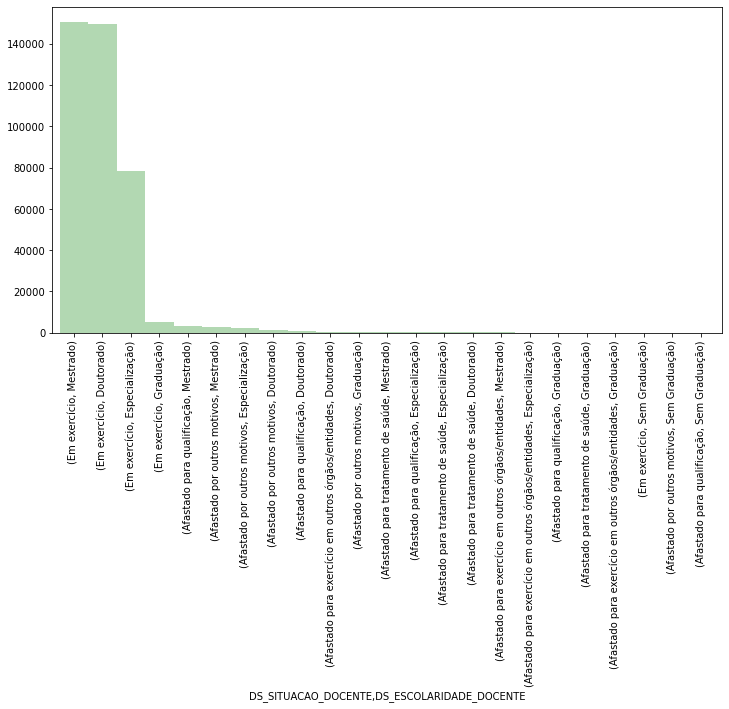

In [161]:
#Os professores na sua maioria tem uma escolaridade boa. 
pra_plotar = docente_escolaridade.value_counts()
pra_plotar.plot.bar(width=1,alpha=0.3,color='green').figure.set_size_inches(12,6)


In [158]:
#DS_CATEGORIA_ADMINISTRATIVA	CO_DOCENTE	DS_SITUACAO_DOCENTE	DS_ESCOLARIDADE_DOCENTE
# Considerei a categoria também pois em universidades públicas é necessário fazer prova - 'capacidade do docente'
DOCENTE_SEL = docente_sel.loc[:,['DS_CATEGORIA_ADMINISTRATIVA','DS_SITUACAO_DOCENTE','DS_ESCOLARIDADE_DOCENTE']]

In [159]:
DOCENTE_ESCOLARIDADE_SEL = DOCENTE_SEL.loc[(DOCENTE_SEL['DS_ESCOLARIDADE_DOCENTE']=='Graduação')|
                                           (DOCENTE_SEL['DS_ESCOLARIDADE_DOCENTE']=='Sem Graduação')]

In [160]:
DOCENTE_ESCOLARIDADE_SEL.groupby('DS_CATEGORIA_ADMINISTRATIVA').count().sort_values('DS_ESCOLARIDADE_DOCENTE',ascending=False)

,DS_SITUACAO_DOCENTE,DS_ESCOLARIDADE_DOCENTE
DS_CATEGORIA_ADMINISTRATIVA,,
Pública Federal,4259,4259
Pública Estadual,1151,1151
Privada sem fins lucrativos,261,261
Especial,88,88
Privada com fins lucrativos,84,84
Pública Municipal,52,52


In [142]:
docente_sel.loc[docente_sel['DS_ESCOLARIDADE_DOCENTE']=='Sem Graduação']

,CO_IES,NO_IES,DS_CATEGORIA_ADMINISTRATIVA,CO_DOCENTE,DS_SITUACAO_DOCENTE,DS_ESCOLARIDADE_DOCENTE,DS_REGIME_TRABALHO
40356,54,UNIVERSIDADE ESTADUAL DE CAMPINAS,Pública Estadual,17717,Em exercício,Sem Graduação,Tempo Integral com dedicação exclusiva
40995,54,UNIVERSIDADE ESTADUAL DE CAMPINAS,Pública Estadual,124413,Afastado por outros motivos,Sem Graduação,Desconhecido
41183,54,UNIVERSIDADE ESTADUAL DE CAMPINAS,Pública Estadual,150470,Em exercício,Sem Graduação,Tempo Integral com dedicação exclusiva
41431,54,UNIVERSIDADE ESTADUAL DE CAMPINAS,Pública Estadual,184608,Em exercício,Sem Graduação,Tempo Integral com dedicação exclusiva
41565,54,UNIVERSIDADE ESTADUAL DE CAMPINAS,Pública Estadual,211551,Em exercício,Sem Graduação,Tempo Parcial
55093,71,UNIVERSIDADE DO ESTADO DO RIO GRANDE DO NORTE,Pública Estadual,118988043848,Afastado por outros motivos,Sem Graduação,Desconhecido
60081,95,UNIVERSIDADE ESTADUAL DO VALE DO ACARAÚ,Pública Estadual,2733,Afastado por outros motivos,Sem Graduação,Desconhecido
143805,568,UNIVERSIDADE ESTADUAL DO MARANHÃO,Pública Estadual,118988150604,Afastado por outros motivos,Sem Graduação,Desconhecido
234963,843,FACULDADE DE CIÊNCIAS E TECNOLOGIA DE BIRIGUI,Pública Municipal,118987942474,Em exercício,Sem Graduação,Horista
234967,843,FACULDADE DE CIÊNCIAS E TECNOLOGIA DE BIRIGUI,Pública Municipal,118987989245,Afastado por outros motivos,Sem Graduação,Desconhecido


In [ ]:
#6) Quais os cursos com maior crescimento de matriculas por região? E quais os com maior queda? Como você explicaria isso.
#Cursos --> QT_MATRICULA_CURSO

In [ ]:
#7) Se você tivesse que abrir um curso (apenas um curso de graduação), qual seria, onde ele seria, qual a modalidade?

### Exercicio_cursos 

### Alunos

### Cursos

### Docentes

### Ies 

### Local